In [2]:
import pandas as pd
import numpy as np
from datetime import datetime

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [4]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [5]:
sns.set(style="whitegrid")
plt.style.use('seaborn-v0_8-whitegrid')
pd.set_option('display.max_columns', None)
np.random.seed(42)

In [8]:
df = pd.read_csv('../datasets/cleaned/cleaned_private.csv')
print(f"Dataset shape: {df.shape}")
print("\nFirst 5 rows of data:")
print(df.head())

Dataset shape: (128349, 23)

First 5 rows of data:
   Project Name  Transacted Price ($)  Area (SQFT)  Unit Price ($ PSF)  \
0    ONE BERNAM             2088000.0       807.30                2586   
1       RIVIERE             3390000.0      1140.98                2971   
2       RIVIERE             3780000.0      1216.33                3108   
3  LEEDON GREEN             1923000.0       710.42                2707   
4  LEEDON GREEN             1590000.0       538.20                2954   

    Sale Date      Street Name Type of Sale Type of Area Property Type  \
0  2022-12-01    BERNAM STREET     New Sale       Strata     Apartment   
1  2022-12-01  JIAK KIM STREET     New Sale       Strata     Apartment   
2  2022-12-01  JIAK KIM STREET     New Sale       Strata     Apartment   
3  2022-12-01   LEEDON HEIGHTS     New Sale       Strata   Condominium   
4  2022-12-01   LEEDON HEIGHTS     New Sale       Strata   Condominium   

   Number of Units                             Tenure  Post

In [9]:
missing_data = df.isnull().sum()
print("\nColumns with missing values:")
print(missing_data[missing_data > 0])


Columns with missing values:
Lease Start Year    27081
dtype: int64


In [10]:
print("\nPerforming data preprocessing...")
# Convert sale date to datetime format
df['Sale Date'] = pd.to_datetime(df['Sale Date'])

# Extract year and month for time-based analysis
df['Sale Year'] = df['Sale Date'].dt.year
df['Sale Month'] = df['Sale Date'].dt.month
df['Sale Quarter'] = df['Sale Date'].dt.quarter
df['YearMonth'] = df['Sale Date'].dt.strftime('%Y-%m')
df['YearQuarter'] = df['Sale Year'].astype(str) + '-Q' + df['Sale Quarter'].astype(str)

# Clean up column names (removing asterisks)
df.columns = [col.replace('*', '') for col in df.columns]

print("After preprocessing, first 5 rows:")
print(df.head())


Performing data preprocessing...
After preprocessing, first 5 rows:
   Project Name  Transacted Price ($)  Area (SQFT)  Unit Price ($ PSF)  \
0    ONE BERNAM             2088000.0       807.30                2586   
1       RIVIERE             3390000.0      1140.98                2971   
2       RIVIERE             3780000.0      1216.33                3108   
3  LEEDON GREEN             1923000.0       710.42                2707   
4  LEEDON GREEN             1590000.0       538.20                2954   

   Sale Date      Street Name Type of Sale Type of Area Property Type  \
0 2022-12-01    BERNAM STREET     New Sale       Strata     Apartment   
1 2022-12-01  JIAK KIM STREET     New Sale       Strata     Apartment   
2 2022-12-01  JIAK KIM STREET     New Sale       Strata     Apartment   
3 2022-12-01   LEEDON HEIGHTS     New Sale       Strata   Condominium   
4 2022-12-01   LEEDON HEIGHTS     New Sale       Strata   Condominium   

   Number of Units                             

In [12]:
def remove_outliers(df, column, multiplier=1.5):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Create a copy of the dataframe and remove outliers
df_no_outliers = df.copy()
df_no_outliers = remove_outliers(df_no_outliers, 'Price')

# Group by year-month with outliers removed
monthly_price_clean = df_no_outliers.groupby('YearMonth')['Price'].agg(['mean', 'median', 'count']).reset_index()
monthly_price_clean.columns = ['YearMonth', 'Mean Price', 'Median Price', 'Transaction Count']


# Time VS Price 

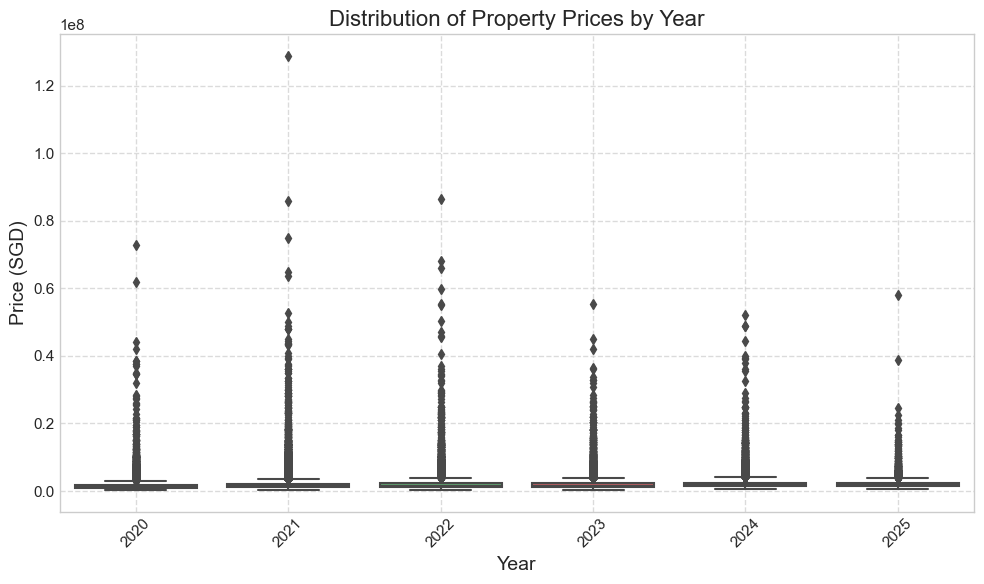

In [14]:
# Group by year-month to get average price trends over time
monthly_price = df.groupby('YearMonth')['Price'].agg(['mean', 'median', 'count']).reset_index()
monthly_price.columns = ['YearMonth', 'Mean Price', 'Median Price', 'Transaction Count']

# Create an interactive time vs price plot
fig_price_time = make_subplots(specs=[[{"secondary_y": True}]])

# Add price trends
fig_price_time.add_trace(
    go.Scatter(x=monthly_price['YearMonth'], y=monthly_price['Mean Price'], 
                name="Mean Price", line=dict(color='blue', width=2)),
    secondary_y=False,
)

fig_price_time.add_trace(
    go.Scatter(x=monthly_price['YearMonth'], y=monthly_price['Median Price'], 
                name="Median Price", line=dict(color='green', width=2)),
    secondary_y=False,
)

# Add transaction volume
fig_price_time.add_trace(
    go.Bar(x=monthly_price['YearMonth'], y=monthly_price['Transaction Count'], 
            name="Transaction Count", marker=dict(color='rgba(220, 220, 220, 0.7)')),
    secondary_y=True,
)

# Update layout
fig_price_time.update_layout(
    title_text="Singapore Private Housing: Price Trends Over Time",
    xaxis=dict(
        title="Time (Year-Month)",
        tickangle=45,
        type='category'
    ),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    template='plotly_white',
    height=600
)

# Set y-axes titles
fig_price_time.update_yaxes(title_text="Price (SGD)", secondary_y=False)
fig_price_time.update_yaxes(title_text="Number of Transactions", secondary_y=True)

# Display the figure
fig_price_time.show()

# Yearly box plot to see price distribution by year
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sale Year', y='Price', data=df)
plt.title('Distribution of Property Prices by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Price (SGD)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

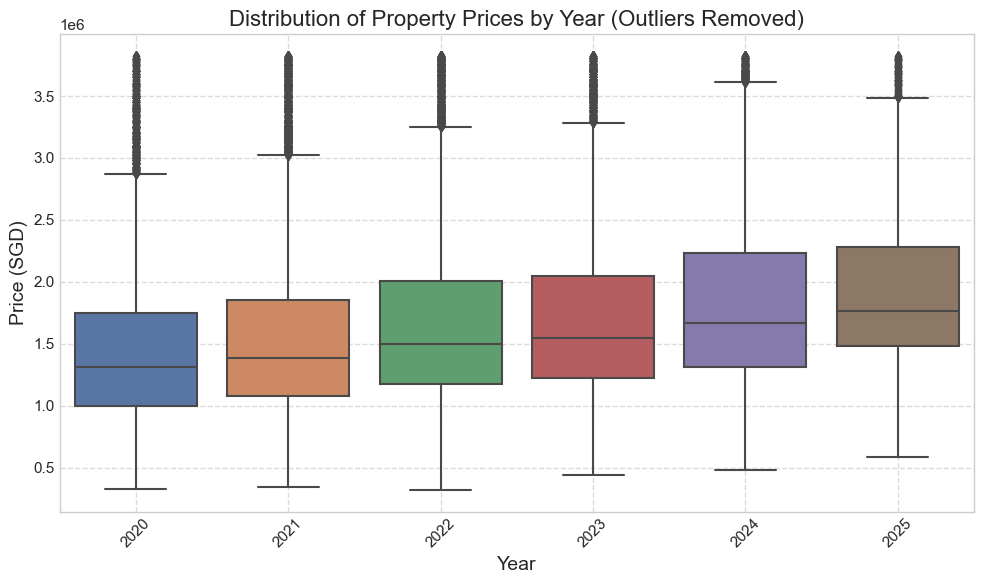

Removed 10023 outliers (7.81% of the dataset)


In [15]:
# Create an interactive time vs price plot without outliers
fig_price_time_clean = make_subplots(specs=[[{"secondary_y": True}]])

# Add price trends
fig_price_time_clean.add_trace(
    go.Scatter(x=monthly_price_clean['YearMonth'], y=monthly_price_clean['Mean Price'], 
              name="Mean Price (No Outliers)", line=dict(color='blue', width=2)),
    secondary_y=False,
)

fig_price_time_clean.add_trace(
    go.Scatter(x=monthly_price_clean['YearMonth'], y=monthly_price_clean['Median Price'], 
              name="Median Price (No Outliers)", line=dict(color='green', width=2)),
    secondary_y=False,
)

# Add transaction volume
fig_price_time_clean.add_trace(
    go.Bar(x=monthly_price_clean['YearMonth'], y=monthly_price_clean['Transaction Count'], 
           name="Transaction Count", marker=dict(color='rgba(220, 220, 220, 0.7)')),
    secondary_y=True,
)

# Update layout
fig_price_time_clean.update_layout(
    title_text="Singapore Private Housing: Price Trends Over Time (Outliers Removed)",
    xaxis=dict(
        title="Time (Year-Month)",
        tickangle=45,
        type='category'
    ),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    template='plotly_white',
    height=600
)

# Set y-axes titles
fig_price_time_clean.update_yaxes(title_text="Price (SGD)", secondary_y=False)
fig_price_time_clean.update_yaxes(title_text="Number of Transactions", secondary_y=True)

# Display the figure
fig_price_time_clean.show()

# Also create a boxplot without outliers to compare distribution
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sale Year', y='Price', data=df_no_outliers)
plt.title('Distribution of Property Prices by Year (Outliers Removed)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Price (SGD)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print stats about how many outliers were removed
outliers_count = len(df) - len(df_no_outliers)
outliers_percentage = (outliers_count / len(df)) * 100
print(f"Removed {outliers_count} outliers ({outliers_percentage:.2f}% of the dataset)")

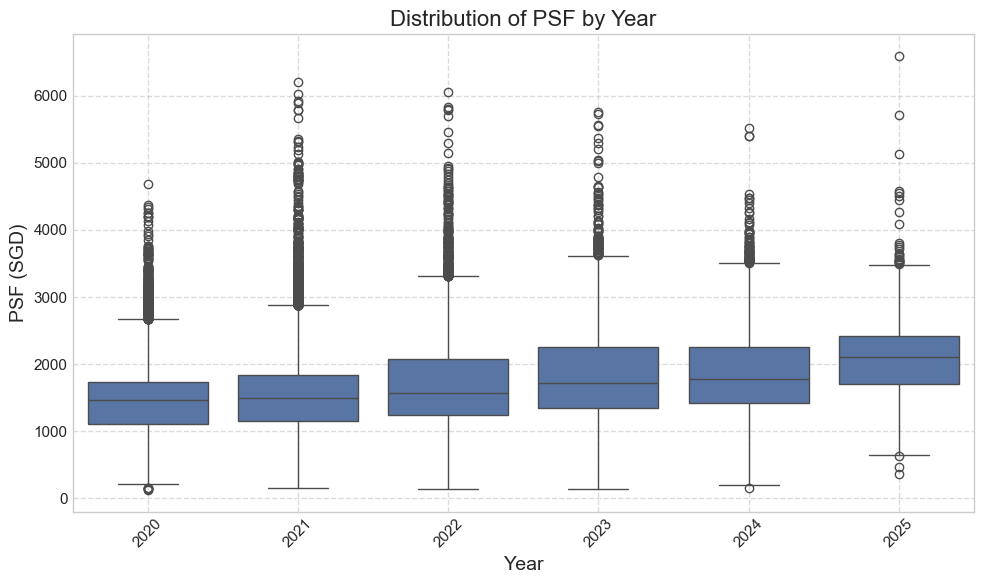

In [47]:
monthly_psf = df.groupby('YearMonth')['Unit Price ($ PSF)'].agg(['mean', 'median', 'count']).reset_index()
monthly_psf.columns = ['YearMonth', 'Mean PSF', 'Median PSF', 'Transaction Count']

# Create an interactive time vs PSF plot
fig_psf_time = make_subplots(specs=[[{"secondary_y": True}]])

# Add PSF trends
fig_psf_time.add_trace(
    go.Scatter(x=monthly_psf['YearMonth'], y=monthly_psf['Mean PSF'], 
                name="Mean PSF", line=dict(color='red', width=2)),
    secondary_y=False,
)

fig_psf_time.add_trace(
    go.Scatter(x=monthly_psf['YearMonth'], y=monthly_psf['Median PSF'], 
                name="Median PSF", line=dict(color='orange', width=2)),
    secondary_y=False,
)

# Add transaction volume
fig_psf_time.add_trace(
    go.Bar(x=monthly_psf['YearMonth'], y=monthly_psf['Transaction Count'], 
            name="Transaction Count", marker=dict(color='rgba(220, 220, 220, 0.7)')),
    secondary_y=True,
)

# Update layout
fig_psf_time.update_layout(
    title_text="Singapore Private Housing: Price Per Square Foot (PSF) Trends Over Time",
    xaxis=dict(
        title="Time (Year-Month)",
        tickangle=45,
        type='category'
    ),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    template='plotly_white',
    height=600
)

# Set y-axes titles
fig_psf_time.update_yaxes(title_text="Price per Square Foot (SGD)", secondary_y=False)
fig_psf_time.update_yaxes(title_text="Number of Transactions", secondary_y=True)

# Display the figure
fig_psf_time.show()

# box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sale Year', y='Unit Price ($ PSF)', data=df)
plt.title('Distribution of PSF by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('PSF (SGD)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

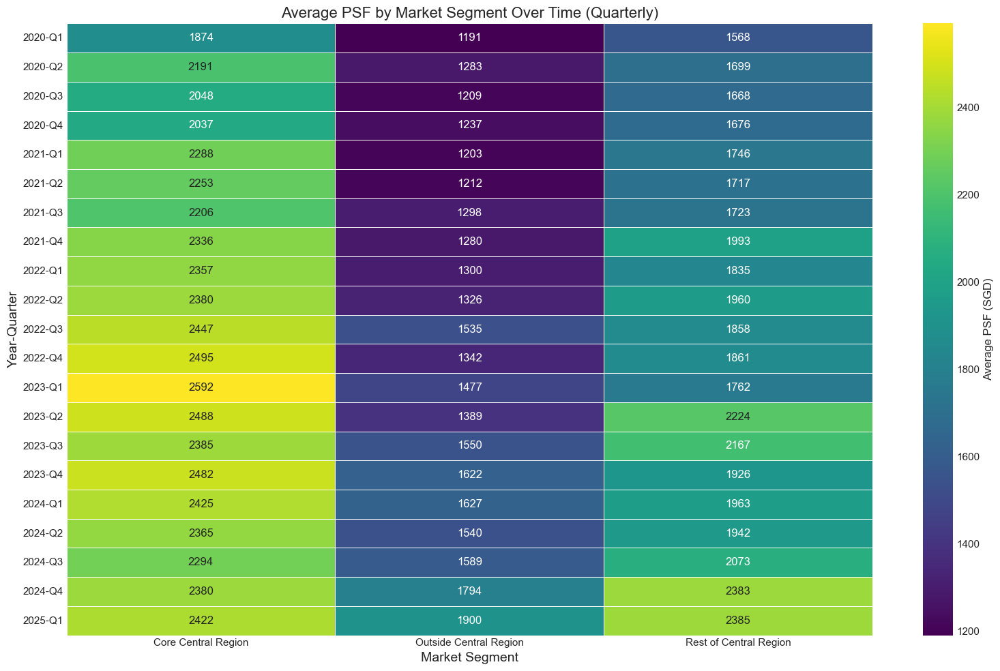

In [48]:
# Market Segment Analysis Over Time
segment_time = df.groupby(['YearQuarter', 'Market Segment'])['Unit Price ($ PSF)'].mean().reset_index()
segment_time_pivot = segment_time.pivot(index='YearQuarter', columns='Market Segment', values='Unit Price ($ PSF)')

# Create the plot
plt.figure(figsize=(16, 10))
sns.heatmap(segment_time_pivot, annot=True, fmt='.0f', cmap='viridis', linewidths=.5, cbar_kws={'label': 'Average PSF (SGD)'})
plt.title('Average PSF by Market Segment Over Time (Quarterly)', fontsize=16)
plt.ylabel('Year-Quarter', fontsize=14)
plt.xlabel('Market Segment', fontsize=14)
plt.tight_layout()
plt.show()

In [16]:
# Property Type Analysis
property_time = df.groupby(['YearQuarter', 'Property Type'])['Unit Price ($ PSF)'].mean().reset_index()

fig_property = px.line(property_time, x='YearQuarter', y='Unit Price ($ PSF)', color='Property Type',
                title='PSF Trends by Property Type',
                labels={'Unit Price ($ PSF)': 'Average PSF (SGD)', 'YearQuarter': 'Year-Quarter'},
                markers=True, line_shape='linear', template='plotly_white',
                height=600)

fig_property.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Property Type"),
    hovermode="x unified"
)

fig_property.show()

property_price_time = df.groupby(['YearQuarter', 'Property Type'])['Price'].mean().reset_index()

fig_property_price = px.line(property_price_time, 
                             x='YearQuarter', 
                             y='Price', 
                             color='Property Type',
                             title='Transaction Price Trends by Property Type',
                             labels={'Price ($)': 'Average Transaction Price (SGD)', 
                                    'YearQuarter': 'Year-Quarter'},
                             markers=True, 
                             line_shape='linear', 
                             template='plotly_white',
                             height=600)

fig_property_price.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Property Type"),
    hovermode="x unified"
)

fig_property_price.show()

In [18]:
# Type of Sale Analysis

#psf
sale_type_time = df.groupby(['YearQuarter', 'Type of Sale'])['Unit Price ($ PSF)'].mean().reset_index()

fig_sale_type = px.line(sale_type_time, x='YearQuarter', y='Unit Price ($ PSF)', color='Type of Sale',
                title='PSF Trends by Type of Sale',
                labels={'Unit Price ($ PSF)': 'Average PSF (SGD)', 'YearQuarter': 'Year-Quarter'},
                markers=True, line_shape='linear', template='plotly_white',
                height=600)

fig_sale_type.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Type of Sale"),
    hovermode="x unified"
)
fig_sale_type.show()

#price
sale_type_price_time = df.groupby(['YearQuarter', 'Type of Sale'])['Price'].mean().reset_index()

fig_sale_type_price = px.line(sale_type_price_time, 
                              x='YearQuarter', 
                              y= 'Price', 
                              color='Type of Sale',
                              title='Transaction Price Trends by Type of Sale',
                              labels={'Transacted Price ($)': 'Average Transaction Price (SGD)', 
                                     'YearQuarter': 'Year-Quarter'},
                              markers=True, 
                              line_shape='linear', 
                              template='plotly_white',
                              height=600)

fig_sale_type_price.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Type of Sale"),
    hovermode="x unified"
)
fig_sale_type_price.show()

Geographical Cluster Summary Statistics:
   Geo Cluster    Price_mean  Price_median  Price_min  Price_max  Price_count  \
0          0.0  2.574848e+06     1888000.0     460000  128800800        41309   
1          1.0  1.848464e+06     1500000.0     495000   49000000        30611   
2          2.0  1.664428e+06     1384000.0     320000   28000000        23783   
3          3.0  2.005260e+06     1547000.0     400000   86000000        24421   
4          4.0  1.348106e+06     1205000.0     493000    9050000         8225   

   Unit Price ($ PSF)_mean  Unit Price ($ PSF)_median  Unit Price ($ PSF)_min  \
0              2107.018422                     2020.0                     203   
1              1571.114011                     1501.0                     295   
2              1400.747635                     1339.0                     120   
3              1613.094140                     1581.0                     212   
4              1211.057751                     1200.0              

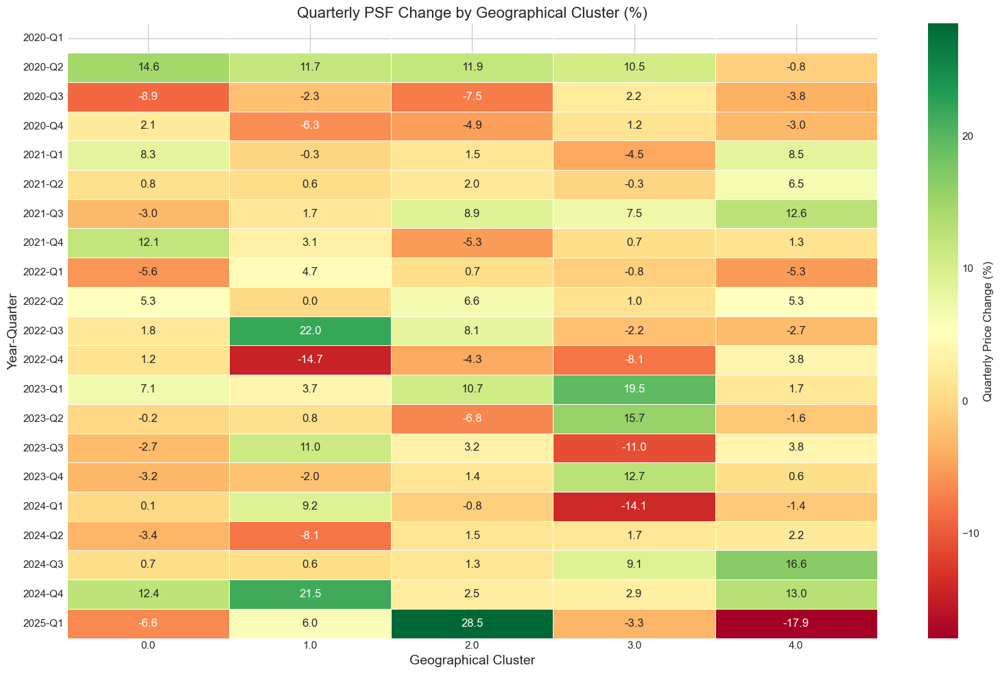

In [20]:
# Location-based clustering using k-means (based only on longitude and latitude)
# Select only geographical coordinates for clustering
location_only = df[['longitude', 'latitude']].copy()

# Drop any rows with missing values
location_only = location_only.dropna()

# Standardize the data for clustering
location_scaler = StandardScaler()
location_only_scaled = location_scaler.fit_transform(location_only)

# Perform k-means clustering with 5 clusters
k = 5  # Number of clusters
kmeans_location = KMeans(n_clusters=k, random_state=42, n_init=10)
geo_clusters = kmeans_location.fit_predict(location_only_scaled)

# Add cluster labels to the original dataframe
df_geo_clusters = df.copy()
df_geo_clusters.loc[location_only.index, 'Geo Cluster'] = geo_clusters

# Create a cluster map colored by geographical clusters
fig_geo_location = px.scatter_mapbox(
    df_geo_clusters.dropna(subset=['Geo Cluster', 'latitude', 'longitude']), 
    lat='latitude', 
    lon='longitude', 
    color='Geo Cluster',
    color_continuous_scale=px.colors.qualitative.Bold, 
    size='Unit Price ($ PSF)',
    size_max=15, 
    zoom=10, 
    height=600, 
    width=800,
    title='Singapore Private Housing Clusters by Geographic Location Only'
)

fig_geo_location.update_layout(mapbox_style="carto-positron")
fig_geo_location.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig_geo_location.show()

# Calculate price statistics for each cluster over time
# 1. Price trends over time by geographical cluster
geo_cluster_time = df_geo_clusters.groupby(['YearQuarter', 'Geo Cluster']).agg({
    'Price': ['mean', 'median', 'std', 'count'],
    'Unit Price ($ PSF)': ['mean', 'median', 'std']
}).reset_index()

# Flatten the multi-index columns
geo_cluster_time.columns = ['_'.join(col).strip('_') if col[1] else col[0] for col in geo_cluster_time.columns.values]

# Create line chart for average transaction price by geographical cluster
fig_geo_price = px.line(
    geo_cluster_time, 
    x='YearQuarter', 
    y='Price_mean', 
    color='Geo Cluster',
    title='Average Transaction Price Trends by Geographical Cluster',
    labels={
        'Transacted Price ($)_mean': 'Average Transaction Price (SGD)', 
        'YearQuarter': 'Year-Quarter',
        'Geo Cluster': 'Geographical Cluster'
    },
    markers=True, 
    line_shape='linear', 
    template='plotly_white',
    height=600
)

fig_geo_price.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Geographical Cluster"),
    hovermode="x unified"
)

fig_geo_price.show()

# Create line chart for average PSF by geographical cluster
fig_geo_psf = px.line(
    geo_cluster_time, 
    x='YearQuarter', 
    y='Unit Price ($ PSF)_mean', 
    color='Geo Cluster',
    title='Average PSF Trends by Geographical Cluster',
    labels={
        'Unit Price ($ PSF)_mean': 'Average PSF (SGD)', 
        'YearQuarter': 'Year-Quarter',
        'Geo Cluster': 'Geographical Cluster'
    },
    markers=True, 
    line_shape='linear', 
    template='plotly_white',
    height=600
)

fig_geo_psf.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Geographical Cluster"),
    hovermode="x unified"
)

fig_geo_psf.show()

# Create a summary table of the geo clusters
cluster_summary = df_geo_clusters.groupby('Geo Cluster').agg({
    'Price': ['mean', 'median', 'min', 'max', 'count'],
    'Unit Price ($ PSF)': ['mean', 'median', 'min', 'max'],
    'Area (SQFT)': ['mean', 'median'],
    'longitude': 'mean',
    'latitude': 'mean'
}).reset_index()

# Flatten the multi-index columns
cluster_summary.columns = ['_'.join(col).strip('_') if col[1] else col[0] for col in cluster_summary.columns.values]

# Print the cluster summary
print("Geographical Cluster Summary Statistics:")
print(cluster_summary)

# Create a heatmap showing the quarterly price changes by cluster
# First, let's calculate the percentage change in PSF for each cluster
geo_cluster_pivot = geo_cluster_time.pivot(index='YearQuarter', columns='Geo Cluster', values='Unit Price ($ PSF)_mean')

# Calculate percentage change
geo_cluster_pct_change = geo_cluster_pivot.pct_change() * 100

# Create heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(geo_cluster_pct_change, annot=True, fmt='.1f', cmap='RdYlGn', linewidths=.5, 
            cbar_kws={'label': 'Quarterly Price Change (%)'})
plt.title('Quarterly PSF Change by Geographical Cluster (%)', fontsize=16)
plt.ylabel('Year-Quarter', fontsize=14)
plt.xlabel('Geographical Cluster', fontsize=14)
plt.tight_layout()
plt.show()

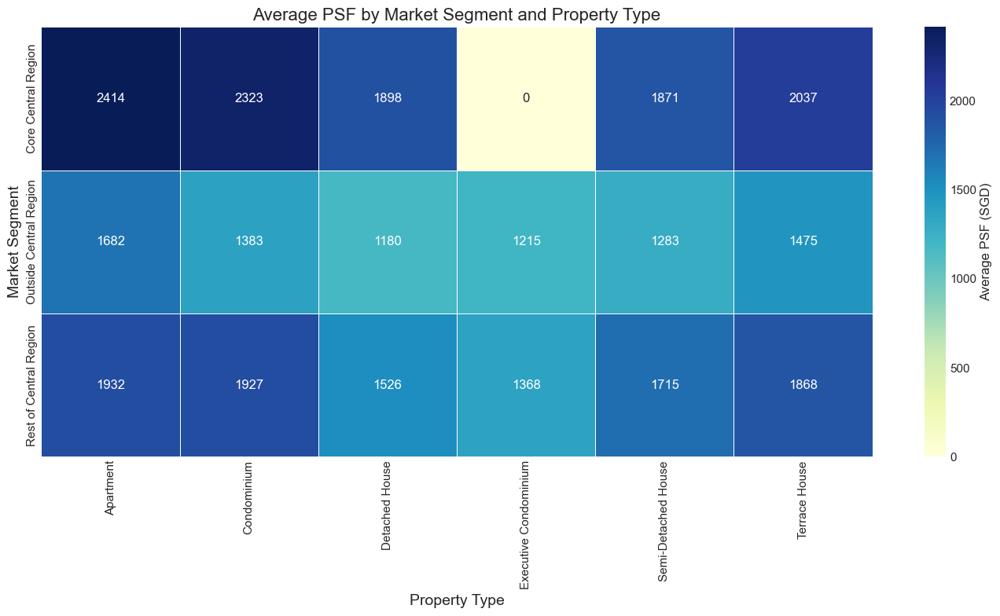

In [52]:
# Multi-factor heatmap: Market Segment x Property Type
multi_factor = df.groupby(['Market Segment', 'Property Type'])['Unit Price ($ PSF)'].mean().unstack().fillna(0)

plt.figure(figsize=(14, 8))
sns.heatmap(multi_factor, annot=True, fmt='.0f', cmap='YlGnBu', linewidths=.5, cbar_kws={'label': 'Average PSF (SGD)'})
plt.title('Average PSF by Market Segment and Property Type', fontsize=16)
plt.ylabel('Market Segment', fontsize=14)
plt.xlabel('Property Type', fontsize=14)
plt.tight_layout()
plt.show()